# 01 — Exploración de la API del Ministerio para la Transición Ecológica

**Proyecto:** Optimización del repostaje en flotas comerciales mediante predicción de precios de carburantes  
**Autor:** Víctor González Martín  
**Notebook:** 01 — Exploración inicial de la API

## Objetivo del notebook

Explorar la API REST oficial del Ministerio para la Transición Ecológica que publica los precios de los carburantes en las estaciones de servicio españolas. Antes de la descarga masiva del histórico, se valida la estructura de los datos, los campos disponibles y el comportamiento de los endpoints.

## Endpoints documentados

- **Datos actuales:** `https://sedeaplicaciones.minetur.gob.es/ServiciosRESTCarburantes/PreciosCarburantes/EstacionesTerrestres/`
- **Datos históricos por fecha:** `https://sedeaplicaciones.minetur.gob.es/ServiciosRESTCarburantes/PreciosCarburantes/EstacionesTerrestresHist/{FECHA}` con formato de fecha `DD-MM-AAAA`.

## Salida esperada

Conocimiento estructurado de la API: qué campos tiene, qué nombres usan, qué tipos de datos devuelven, qué peculiaridades hay que tener en cuenta para la descarga sistemática del histórico.


In [1]:
# Verificación del entorno de ejecución
# Esta celda confirma que el notebook se ejecuta en el entorno conda correcto del TFM.

import sys
import os

# Configuración del entorno esperado
ENTORNO_ESPERADO = "repostapro"
PROYECTO = "RepostaPro"

print(f"Proyecto: {PROYECTO}")
print(f"Python ejecutable: {sys.executable}")
print(f"Versión de Python: {sys.version.split()[0]}")
print(f"Directorio de trabajo: {os.getcwd()}")

# Comprobación explícita
if ENTORNO_ESPERADO in sys.executable:
    print(f"\n✓ Entorno conda correcto: {ENTORNO_ESPERADO}")
else:
    print(f"\n⚠ ATENCIÓN: NO estás en el entorno {ENTORNO_ESPERADO}. Reinicia el kernel.")


Proyecto: RepostaPro
Python ejecutable: C:\Users\vicgon\AppData\Local\anaconda3\envs\repostapro\python.exe
Versión de Python: 3.12.12
Directorio de trabajo: C:\TFM\notebooks\backups

✓ Entorno conda correcto: repostapro


In [33]:
# Imports necesarios para la exploración
import requests
import pandas as pd
import numpy as np
from pprint import pprint
import json
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path


# Configuración de visualización para que pandas no recorte columnas
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', 50)

# Versiones de las librerías (útil para reproducibilidad)
print(f"requests: {requests.__version__}")
print(f"pandas: {pd.__version__}")
print(f"numpy: {np.__version__}")


requests: 2.34.2
pandas: 3.0.3
numpy: 2.4.6


In [48]:
# Primera llamada a la API: endpoint de datos actuales
# Endpoint público del Ministerio para la Transición Ecológica que devuelve
# los precios actuales de todas las estaciones de servicio de España.
# Documentación: https://geoportalgasolineras.es/ (sección APIs)

URL_ACTUAL = "https://sedeaplicaciones.minetur.gob.es/ServiciosRESTCarburantes/PreciosCarburantes/EstacionesTerrestres/"

# Cabeceras: pedimos explícitamente respuesta en JSON (la API también devuelve XML por defecto)
HEADERS = {"Accept": "application/json"}

# Hacemos la petición
print("Haciendo petición a la API...")
response = requests.get(URL_ACTUAL, headers=HEADERS, timeout=30)

# Verificamos el código de estado HTTP
# 200 = OK, 4xx = error del cliente, 5xx = error del servidor
print(f"Código de respuesta HTTP: {response.status_code}")
print(f"Tipo de contenido: {response.headers.get('Content-Type')}")
print(f"Tamaño de la respuesta: {len(response.content) / 1024:.2f} KB")


Haciendo petición a la API...
Código de respuesta HTTP: 200
Tipo de contenido: application/json; charset=utf-8
Tamaño de la respuesta: 11924.94 KB


In [4]:
# Parsear el JSON de la respuesta HTTP a un diccionario Python
data = response.json()


In [5]:
# Exploración de la estructura de la respuesta JSON
# Inspeccionamos las claves de primer nivel y su contenido resumido.

print("Claves de primer nivel en la respuesta JSON:")
for clave in data.keys():
    valor = data[clave]
    # Mostramos el tipo y, si es una lista, su longitud
    if isinstance(valor, list):
        print(f"  • {clave!r:35} → lista con {len(valor):,} elementos")
    elif isinstance(valor, dict):
        print(f"  • {clave!r:35} → diccionario con {len(valor)} claves")
    else:
        # Si es un valor simple (string, número), lo mostramos truncado
        valor_str = str(valor)[:80]
        print(f"  • {clave!r:35} → {valor_str!r}")


Claves de primer nivel en la respuesta JSON:
  • 'Fecha'                             → '08/06/2026 21:11:29'
  • 'ListaEESSPrecio'                   → lista con 11,485 elementos
  • 'Nota'                              → 'Archivo de todos los productos en todas las estaciones de servicio. La actualiza'
  • 'ResultadoConsulta'                 → 'OK'


In [6]:
# Exploración de la estructura de una estación individual

# Extraemos la lista de estaciones del JSON
estaciones = data["ListaEESSPrecio"]

# Cogemos la primera estación como muestra
primera_estacion = estaciones[0]

# Mostramos todos sus campos de forma legible
print(f"Número total de estaciones: {len(estaciones):,}\n")
print(f"Campos disponibles en cada estación ({len(primera_estacion)} campos):\n")

# Recorremos los campos y los mostramos en columnas alineadas
for campo, valor in primera_estacion.items():
    # Truncamos el valor si es muy largo, para mantener legibilidad
    valor_str = str(valor)
    if len(valor_str) > 60:
        valor_str = valor_str[:57] + "..."
    print(f"  {campo:30} → {valor_str!r}")


Número total de estaciones: 11,485

Campos disponibles en cada estación (41 campos):

  C.P.                           → '02250'
  Dirección                      → 'AVENIDA CASTILLA LA MANCHA, 26'
  Horario                        → 'L-D: 07:00-22:00'
  Latitud                        → '39,211417'
  Localidad                      → 'ABENGIBRE'
  Longitud (WGS84)               → '-1,539167'
  Margen                         → 'D'
  Municipio                      → 'Abengibre'
  Precio Adblue                  → ''
  Precio Amoniaco                → ''
  Precio Biodiesel               → ''
  Precio Bioetanol               → ''
  Precio Biogas Natural Comprimido → ''
  Precio Biogas Natural Licuado  → ''
  Precio Diésel Renovable        → ''
  Precio Gas Natural Comprimido  → ''
  Precio Gas Natural Licuado     → ''
  Precio Gases licuados del petróleo → ''
  Precio Gasoleo A               → '1,559'
  Precio Gasoleo B               → '1,129'
  Precio Gasoleo Premium         → ''
  Precio Gas

## Estructura de la respuesta de la API

### Características generales
- La API devuelve un JSON con **4 claves de primer nivel**: `Fecha`, `ListaEESSPrecio`, `Nota`, `ResultadoConsulta`.
- La respuesta incluye la lista completa de estaciones de servicio activas en España en el momento de la consulta.
- Cada estación contiene **41 campos**.
- Codificación: UTF-8 (soporte completo de caracteres españoles).
- El campo `Fecha` permite trazar el momento exacto de la consulta, lo que es fundamental para construir el histórico.

### Categorías de campos por estación

**Identificación (5 campos):** `IDEESS` (clave primaria), `IDMunicipio`, `IDProvincia`, `IDCCAA`, `C.P.`

**Ubicación (6 campos):** `Dirección`, `Localidad`, `Municipio`, `Provincia`, `Latitud`, `Longitud (WGS84)`

**Descriptivos (5 campos):** `Rótulo` (marca comercial), `Horario`, `Margen`, `Tipo Venta`, `Remisión`

**Precios (22 campos):** carburantes convencionales (Gasóleo A, Gasóleo B, Gasolina 95 E5, etc.) y alternativos (GLP, GNC, GNL, hidrógeno, bioetanol, biodiésel, etc.).

**Composición química (2 campos):** `% BioEtanol`, `% Éster metílico`.

### Particularidades técnicas detectadas

1. **Decimales con coma**: precios y coordenadas se entregan como strings con coma decimal (ej. `'1,559'`). Requerirá conversión a `float` reemplazando `,` por `.`.
2. **Valores ausentes**: los precios no disponibles se entregan como string vacío (`''`), no como `null`. Deberán convertirse a `NaN` para análisis estadístico correcto.
3. **Códigos con ceros a la izquierda**: identificadores administrativos (`IDProvincia`, `C.P.`) deben mantenerse como strings para preservar los ceros.
4. **Cobertura de carburantes heterogénea**: las estaciones rurales suelen ofrecer solo 2-3 carburantes; las urbanas pueden ofrecer la gama completa.

### Carburantes incluidos en el análisis

Para el alcance del TFM (optimización de repostaje en flotas comerciales) se trabajará con:

**Núcleo del análisis predictivo:**
- **Gasóleo A** — combustible mayoritario en flotas de transporte y mercancías.
- **Gasóleo Premium** — variante premium del diésel, para análisis comparativo.
- **Gasolina 95 E5** — combustible mayoritario en turismos comerciales.
- **Gasolina 98 E5** — variante premium de gasolina, para análisis comparativo.

**Análisis secundario (descriptivo y geográfico):**
- **GLP** (Gases Licuados del Petróleo) — análisis de cobertura y diferencial de precio respecto al diésel, sin modelado predictivo debido a la menor cobertura geográfica.
- **AdBlue** — aditivo de urea obligatorio en motores diésel Euro 6. Aunque no es combustible propiamente, forma parte del coste operativo real de cualquier flota Euro 6. Se incluye como complemento del análisis de diésel.

**Excluidos del análisis:** Gasóleo B (carburante agrícola subsidiado, fuera del alcance comercial), Biodiésel, GNC, GNL, hidrógeno, metanol y otros minoritarios con cobertura insuficiente para análisis estadístico.


In [7]:
# Conversión a DataFrame de pandas
# La lista de estaciones del JSON se convierte a un DataFrame de pandas para
# facilitar el análisis exploratorio. pd.json_normalize aplana automáticamente
# la lista de diccionarios en una tabla tabular.

# Extraemos la lista de estaciones del JSON
estaciones = data["ListaEESSPrecio"]

# Convertimos a DataFrame
df = pd.json_normalize(estaciones)

# Información básica del DataFrame resultante
print(f"Dimensiones del DataFrame: {df.shape[0]:,} filas × {df.shape[1]} columnas")
print(f"Memoria ocupada:           {df.memory_usage(deep=True).sum() / 1024 / 1024:.2f} MB")
print(f"\nPrimeras filas del DataFrame:")
df.head(3)


Dimensiones del DataFrame: 11,485 filas × 41 columnas
Memoria ocupada:           5.19 MB

Primeras filas del DataFrame:


,C.P.,Dirección,Horario,Latitud,Localidad,Longitud (WGS84),Margen,Municipio,Precio Adblue,Precio Amoniaco,Precio Biodiesel,Precio Bioetanol,Precio Biogas Natural Comprimido,Precio Biogas Natural Licuado,Precio Diésel Renovable,Precio Gas Natural Comprimido,Precio Gas Natural Licuado,Precio Gases licuados del petróleo,Precio Gasoleo A,Precio Gasoleo B,Precio Gasoleo Premium,Precio Gasolina 95 E10,Precio Gasolina 95 E25,Precio Gasolina 95 E5,Precio Gasolina 95 E5 Premium,Precio Gasolina 95 E85,Precio Gasolina 98 E10,Precio Gasolina 98 E5,Precio Gasolina Renovable,Precio Hidrogeno,Precio Metanol,Provincia,Remisión,Rótulo,Tipo Venta,% BioEtanol,% Éster metílico,IDEESS,IDMunicipio,IDProvincia,IDCCAA
0,02250,"AVENIDA CASTILLA LA MANCHA, 26",L-D: 07:00-22:00,"39,211417",ABENGIBRE,"-1,539167",D,Abengibre,,,,,,,,,,,"1,559","1,129",,,,"1,439",,,,,,,,ALBACETE,dm,Nº 10.935,P,"0,0","0,0",4375,52,02,07
1,02152,"CR CM-332, 46,4",L-D: 7:00-23:00,"39,100389",ALATOZ,"-1,346083",I,Alatoz,,,,,,,,,,,"1,879",,"1,969",,,"1,649",,,,,,,,ALBACETE,dm,REPSOL,P,"0,0","0,0",5122,53,02,07
2,02001,CALLE PRINCIPE DE ASTURIAS (POLÍGONO DE ROMICA...,L-D: 06:00-22:00,"39,054694",ALBACETE,"-1,832000",I,Albacete,"1,119",,,,,,,,,,"1,699",,"1,789",,,"1,539",,,,"1,679",,,,ALBACETE,OM,BP ROMICA,P,"0,0","0,0",12054,54,02,07


In [8]:
# Tipos de datos y valores ausentes
# Inspección formal de los tipos de cada columna y conteo de valores ausentes.
# pd.json_normalize ha cargado todo como 'object' (texto) porque la API devuelve
# strings para todos los campos. Esto es esperable y se corregirá en el preprocesado.

print("Información general del DataFrame:")
print("=" * 70)
df.info(verbose=True, show_counts=True)


Información general del DataFrame:
<class 'pandas.DataFrame'>
RangeIndex: 11485 entries, 0 to 11484
Data columns (total 41 columns):
 #   Column                              Non-Null Count  Dtype
---  ------                              --------------  -----
 0   C.P.                                11485 non-null  str  
 1   Dirección                           11485 non-null  str  
 2   Horario                             11485 non-null  str  
 3   Latitud                             11485 non-null  str  
 4   Localidad                           11485 non-null  str  
 5   Longitud (WGS84)                    11485 non-null  str  
 6   Margen                              11485 non-null  str  
 7   Municipio                           11485 non-null  str  
 8   Precio Adblue                       11485 non-null  str  
 9   Precio Amoniaco                     11485 non-null  str  
 10  Precio Biodiesel                    11485 non-null  str  
 11  Precio Bioetanol                    11485 n

## Limpieza preliminar de los datos

La inspección anterior revela tres tareas de limpieza imprescindibles antes de cualquier análisis estadístico:

1. **Conversión de strings vacíos a `NaN`**: la API devuelve cadenas vacías (`""`) en los precios que la estación no oferta. Pandas no las reconoce como valores ausentes por defecto, lo que falsea el conteo de cobertura.

2. **Conversión de precios a tipo numérico**: todos los precios vienen como strings con coma decimal (ej. `"1,559"`). Hay que sustituir la coma por punto y convertir a `float`.

3. **Conversión de coordenadas a tipo numérico**: latitud y longitud presentan el mismo problema que los precios.

Los identificadores administrativos (`C.P.`, `IDProvincia`, etc.) se mantienen como string para preservar los ceros a la izquierda.


In [9]:
# Conversión de strings vacíos a NaN
# La API devuelve "" para los precios que la estación no comercializa.
# Pandas los cuenta como valores presentes, lo que falsea el análisis de cobertura.
# Sustituimos "" por NaN para que el conteo de no-nulos sea correcto.

df = df.replace("", np.nan)

# Verificación: ahora algunos campos deberían tener valores ausentes detectados
print("Conteo de valores presentes por columna (tras conversión):")
print("=" * 70)
print(df.notna().sum().sort_values(ascending=False))


Conteo de valores presentes por columna (tras conversión):
C.P.                                  11485
Dirección                             11485
Horario                               11485
Latitud                               11485
Localidad                             11485
Longitud (WGS84)                      11485
Margen                                11485
Municipio                             11485
Rótulo                                11485
Remisión                              11485
Tipo Venta                            11485
% BioEtanol                           11485
% Éster metílico                      11485
IDEESS                                11485
IDMunicipio                           11485
IDCCAA                                11485
IDProvincia                           11485
Provincia                             11485
Precio Gasoleo A                      11272
Precio Gasolina 95 E5                 10908
Precio Gasoleo Premium                 5979
Precio Gasolina 9

## Conversión de tipos numéricos

Tras la conversión de cadenas vacías a `NaN`, el siguiente paso es transformar al tipo numérico los campos que efectivamente contienen valores numéricos:

- **Precios de carburantes**: 22 columnas. Vienen como strings con coma decimal (ej. `"1,559"`). Conversión: sustituir `,` por `.` y convertir a `float`.
- **Coordenadas geográficas**: latitud y longitud. Mismo tratamiento.
- **Porcentajes**: `% BioEtanol` y `% Éster metílico`. Mismo tratamiento.

Los identificadores administrativos (`C.P.`, `IDEESS`, `IDProvincia`, `IDMunicipio`, `IDCCAA`) se mantienen como string para preservar los ceros a la izquierda.


In [10]:
# Conversión de precios, coordenadas y porcentajes a tipo numérico
# Los valores vienen como strings con coma decimal española (ej. "1,559").
# Sustituimos la coma por punto y convertimos a float.
# Los NaN se preservan automáticamente durante la conversión.

# Identificar las columnas que hay que convertir
columnas_precio = [col for col in df.columns if col.startswith("Precio")]
columnas_coordenadas = ["Latitud", "Longitud (WGS84)"]
columnas_porcentajes = ["% BioEtanol", "% Éster metílico"]

columnas_a_numerico = columnas_precio + columnas_coordenadas + columnas_porcentajes

print(f"Columnas a convertir a numérico: {len(columnas_a_numerico)}")
print(f"  - Precios:      {len(columnas_precio)}")
print(f"  - Coordenadas:  {len(columnas_coordenadas)}")
print(f"  - Porcentajes:  {len(columnas_porcentajes)}")

# Conversión: reemplazar coma por punto y pasar a float
for col in columnas_a_numerico:
    df[col] = df[col].str.replace(",", ".", regex=False).astype(float)

# Verificación: ahora estas columnas deberían ser float64
print(f"\nVerificación de los tipos tras la conversión:")
print("=" * 70)
print(df.dtypes.value_counts())
print(f"\nEjemplo del 'Precio Gasoleo A':")
print(df["Precio Gasoleo A"].describe())


Columnas a convertir a numérico: 27
  - Precios:      23
  - Coordenadas:  2
  - Porcentajes:  2

Verificación de los tipos tras la conversión:
float64    27
str        14
Name: count, dtype: int64

Ejemplo del 'Precio Gasoleo A':
count    11272.000000
mean         1.612226
std          0.086169
min          1.299000
25%          1.549000
50%          1.635000
75%          1.679000
max          1.999000
Name: Precio Gasoleo A, dtype: float64


## Caracterización de la oferta por estación

¿Cuántos carburantes distintos ofrece cada estación? Este indicador nos permite distinguir entre estaciones "monoproducto" (estaciones rurales con solo diésel y gasolina) y estaciones "premium" con gama completa (urbanas, autopistas, multiservicio).


In [11]:
# Cálculo del número de carburantes ofertados por estación
columnas_precio = [col for col in df.columns if col.startswith("Precio")]

# Contamos cuántos precios NO son NaN por cada fila (estación)
df["n_carburantes"] = df[columnas_precio].notna().sum(axis=1)

# Distribución del número de carburantes por estación
print("Distribución del número de carburantes ofertados por estación:")
print("=" * 70)
print(df["n_carburantes"].describe())
print("\nDistribución detallada:")
print(df["n_carburantes"].value_counts().sort_index())


Distribución del número de carburantes ofertados por estación:
count    11485.000000
mean         3.738006
std          1.232706
min          1.000000
25%          3.000000
50%          4.000000
75%          5.000000
max          9.000000
Name: n_carburantes, dtype: float64

Distribución detallada:
n_carburantes
1     210
2    2106
3    2042
4    4135
5    2220
6     670
7      94
8       7
9       1
Name: count, dtype: int64


### Las estaciones más completas y más exclusivas

Antes de continuar con el análisis general, examinamos los extremos de la distribución por su valor descriptivo del mercado:

- ¿Qué estaciones ofrecen la gama más completa (8-9 carburantes)?
- ¿Qué estaciones se especializan en un solo producto?


In [12]:
# Estaciones con la gama más amplia (8 o 9 carburantes)
print("ESTACIONES CON MAYOR DIVERSIDAD DE CARBURANTES (≥8)")
print("=" * 80)
estaciones_top = df[df["n_carburantes"] >= 8][
    ["n_carburantes", "Rótulo", "Municipio", "Provincia", "Dirección"]
].sort_values("n_carburantes", ascending=False)
print(estaciones_top.to_string(index=False))

# Distribución de las estaciones monoproducto
print("\n" + "=" * 80)
print("ESTACIONES MONOPRODUCTO (1 carburante): rótulos más frecuentes")
print("=" * 80)
mono = df[df["n_carburantes"] == 1]
print(mono["Rótulo"].value_counts().head(10))


ESTACIONES CON MAYOR DIVERSIDAD DE CARBURANTES (≥8)
 n_carburantes               Rótulo                            Municipio Provincia                                          Dirección
             9         ALAS CENTRAL Vandellòs i l'Hospitalet de l'Infant TARRAGONA                              CARRER DE JOAN ORÓ, 2
             8               REPSOL                             Albatera  ALICANTE                  CARRETERA CATRAL-ALBATERA KM. 4,2
             8               REPSOL                 Jerez de la Frontera     CÁDIZ                         CARRETERA A-381 KM. 11,500
             8         BEROIL, S.L.                               Rubena    BURGOS                                         N-I km 249
             8               REPSOL                              Hernani  GIPUZKOA                              AUTOPISTA AP-8 KM. 22
             8 ARENAS CAMACHO, S.L.                             Mengíbar      JAÉN                     N-323A (BAILÉN-MOTRIL) km 14,4
          

### Tipo de venta: estaciones públicas vs restringidas

La API distingue entre estaciones de venta pública (`Tipo Venta = "P"`) y restringida (`Tipo Venta = "R"`). Las estaciones restringidas son normalmente cooperativas agrícolas, estaciones internas de empresas de transporte, depósitos militares, etc. Para el alcance de este TFM (flotas comerciales con acceso libre al mercado), interesa centrarse en las de venta pública.


In [13]:
# Análisis del tipo de venta y su relación con la oferta de carburantes
print("Distribución por tipo de venta:")
print("=" * 70)
print(df["Tipo Venta"].value_counts(dropna=False))
print(f"\nPorcentaje sobre el total:")
print((df["Tipo Venta"].value_counts(normalize=True) * 100).round(2))

print("\n" + "=" * 70)
print("¿Las estaciones monoproducto son mayoritariamente restringidas?")
print("=" * 70)
tabla_cruzada = df.groupby("Tipo Venta")["n_carburantes"].agg(["count", "mean", "median"])
print(tabla_cruzada.round(2))


Distribución por tipo de venta:
Tipo Venta
P    11485
Name: count, dtype: int64

Porcentaje sobre el total:
Tipo Venta
P    100.0
Name: proportion, dtype: float64

¿Las estaciones monoproducto son mayoritariamente restringidas?
            count  mean  median
Tipo Venta                     
P           11485  3.74     4.0


## Distribuciones de precios por carburante

Esta sección caracteriza estadísticamente los precios de los carburantes incluidos en el análisis. El objetivo es:

1. **Conocer el nivel de precios actual** (media, mediana, dispersión).
2. **Cuantificar el diferencial** entre la estación más cara y la más barata, ya que dicho diferencial constituye la oportunidad real de ahorro para una flota optimizada.
3. **Identificar valores extremos** (outliers) que pudieran corresponder a errores de carga, precios subvencionados o casos atípicos.

Carburantes analizados:

- **Núcleo predictivo**: Gasóleo A, Gasóleo Premium, Gasolina 95 E5, Gasolina 98 E5.
- **Análisis secundario**: GLP, AdBlue.

In [15]:
# Estadística descriptiva de los carburantes relevantes para el TFM
# Selección: 4 carburantes del núcleo predictivo + GLP + AdBlue

CARBURANTES_NUCLEO = [
    "Precio Gasoleo A",
    "Precio Gasoleo Premium",
    "Precio Gasolina 95 E5",
    "Precio Gasolina 98 E5",
]

CARBURANTES_SECUNDARIOS = [
    "Precio Gases licuados del petróleo",  # GLP
    "Precio Adblue",
]

CARBURANTES_TFM = CARBURANTES_NUCLEO + CARBURANTES_SECUNDARIOS

# Tabla resumen con estadísticas descriptivas
resumen = df[CARBURANTES_TFM].describe().T

# Añadimos columnas calculadas: rango y coeficiente de variación
resumen["rango"] = resumen["max"] - resumen["min"]
resumen["cv (%)"] = (resumen["std"] / resumen["mean"] * 100).round(2)
resumen["cobertura (%)"] = (resumen["count"] / len(df) * 100).round(1)

# Renombramos para legibilidad
resumen = resumen.rename(columns={
    "count": "n_estaciones",
    "mean": "media",
    "std": "desv_std",
    "min": "mínimo",
    "25%": "Q1",
    "50%": "mediana",
    "75%": "Q3",
    "max": "máximo",
})

# Reordenamos columnas
resumen = resumen[[
    "n_estaciones", "cobertura (%)", "media", "mediana", "desv_std",
    "mínimo", "Q1", "Q3", "máximo", "rango", "cv (%)"
]]

# Formato bonito de salida
print("ESTADÍSTICA DESCRIPTIVA DE LOS CARBURANTES DEL TFM")
print("=" * 100)
print(resumen.round(3).to_string())

ESTADÍSTICA DESCRIPTIVA DE LOS CARBURANTES DEL TFM
                                    n_estaciones  cobertura (%)  media  mediana  desv_std  mínimo     Q1     Q3  máximo  rango  cv (%)
Precio Gasoleo A                         11272.0           98.1  1.612    1.635     0.086   1.299  1.549  1.679   1.999  0.700    5.34
Precio Gasoleo Premium                    5979.0           52.1  1.707    1.729     0.090   1.399  1.659  1.769   2.100  0.701    5.26
Precio Gasolina 95 E5                    10908.0           95.0  1.519    1.539     0.085   1.249  1.455  1.585   1.950  0.701    5.63
Precio Gasolina 98 E5                     5532.0           48.2  1.683    1.697     0.070   1.370  1.659  1.725   2.500  1.130    4.17
Precio Gases licuados del petróleo         988.0            8.6  1.018    1.029     0.077   0.739  0.969  1.079   1.229  0.490    7.52
Precio Adblue                             2873.0           25.0  0.938    0.899     0.242   0.424  0.799  1.019   2.460  2.036   25.76


### Lectura rápida de la tabla

- **Rango de ~0,70 €/L común en todos los carburantes principales**: refleja el margen comercial discrecional de las estaciones y constituye la base económica del TFM.
- **Sobreprecio Gasóleo Premium vs A**: ~10 cts/L de mediana.
- **GLP**: ~40% más barato que diésel, pero solo 8,6% de cobertura.
- **AdBlue presenta un CV del 25,75%**: dispersión atribuible a diferencias de formato comercial (granel vs bidón), no solo al precio puro.

El detalle interpretativo y los cálculos de impacto económico se desarrollan en la memoria del TFM.

### Visualización: boxplots comparativos

Para complementar la tabla numérica anterior, se generan boxplots comparativos de los cuatro carburantes del núcleo predictivo. Esta visualización permite apreciar de un vistazo la mediana, el rango intercuartílico, los bigotes y los valores atípicos (outliers) de cada carburante en la misma escala.

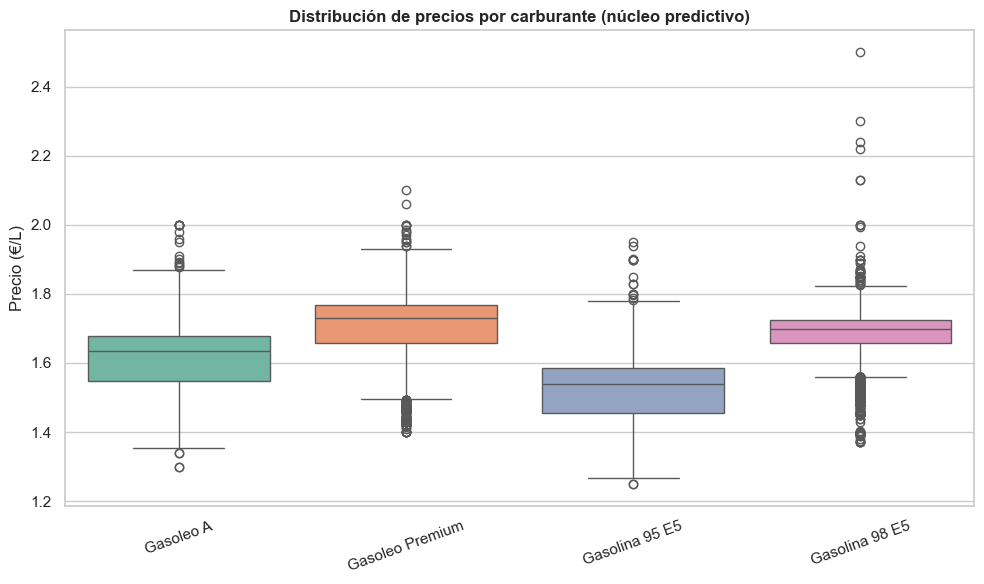

In [19]:
# Boxplots comparativos de los 4 carburantes del núcleo predictivo
# Configuración estética general
sns.set_style("whitegrid")
sns.set_context("notebook", font_scale=1.0)

# Crear figura
fig, ax = plt.subplots(figsize=(10, 6))

# Preparamos los datos en formato "largo" (long format)
df_largo = df[CARBURANTES_NUCLEO].melt(
    var_name="Carburante",
    value_name="Precio (€/L)"
).dropna()

# Limpiar el prefijo "Precio " para etiquetas más legibles
df_largo["Carburante"] = df_largo["Carburante"].str.replace("Precio ", "")

sns.boxplot(
    data=df_largo,
    x="Carburante",
    y="Precio (€/L)",
    hue="Carburante",
    legend=False,
    palette="Set2",
    ax=ax,
)
ax.set_title("Distribución de precios por carburante (núcleo predictivo)",
             fontsize=12, fontweight="bold")
ax.set_xlabel("")
ax.tick_params(axis="x", rotation=20)

plt.tight_layout()
plt.show()

### Histogramas comparativos de los cuatro carburantes núcleo

El histograma del Gasóleo A revela una **distribución bimodal** con dos modas separadas (~1,55 €/L y ~1,68 €/L), sugiriendo la coexistencia de dos segmentos diferenciados en el mercado de estaciones de servicio: low-cost (hipermercados, cooperativas, marcas como Plenergy) frente a marcas tradicionales (Repsol, Cepsa, BP, Galp).

A continuación se generan los histogramas de los cuatro carburantes del núcleo predictivo para verificar si este patrón se replica en los demás.

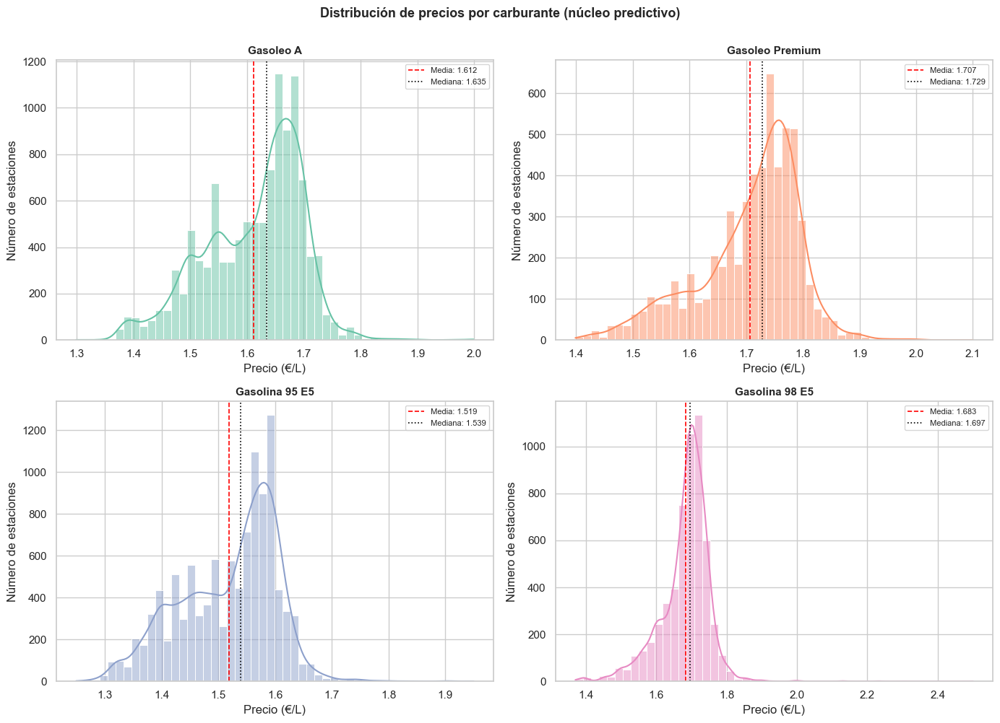

In [20]:
# Histogramas comparativos de los 4 carburantes del núcleo predictivo
# Una sola figura con 4 subplots para análisis comparativo de las distribuciones

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()  # convertimos la matriz 2×2 en lista para iterar fácil

# Paleta consistente con los boxplots
colores = sns.color_palette("Set2", n_colors=4)

for i, carburante in enumerate(CARBURANTES_NUCLEO):
    ax = axes[i]

    # Histograma con curva de densidad
    sns.histplot(
        data=df,
        x=carburante,
        bins=50,
        kde=True,
        color=colores[i],
        ax=ax,
    )

    # Líneas de referencia: media y mediana
    media = df[carburante].mean()
    mediana = df[carburante].median()
    ax.axvline(media, color="red", linestyle="--", linewidth=1.2, label=f"Media: {media:.3f}")
    ax.axvline(mediana, color="black", linestyle=":", linewidth=1.2, label=f"Mediana: {mediana:.3f}")

    # Estética
    nombre_limpio = carburante.replace("Precio ", "")
    ax.set_title(f"{nombre_limpio}", fontsize=11, fontweight="bold")
    ax.set_xlabel("Precio (€/L)")
    ax.set_ylabel("Número de estaciones")
    ax.legend(fontsize=8)

plt.suptitle("Distribución de precios por carburante (núcleo predictivo)",
             fontsize=13, fontweight="bold", y=1.00)
plt.tight_layout()
plt.show()

## Análisis geográfico de los precios

¿Existe un patrón territorial en los precios de los carburantes? Esta sección explora la dimensión geográfica del mercado español de combustibles. El análisis se centra en el **Gasóleo A** por ser el más relevante para flotas comerciales y el de mayor cobertura (98% de las estaciones).

Objetivos de esta sección:
- Identificar provincias con precios sistemáticamente más altos o más bajos.
- Detectar patrones por Comunidad Autónoma (efectos de impuestos autonómicos, insularidad, estructura del mercado regional).
- Visualizar geográficamente la red de estaciones de servicio sobre un mapa de España.

In [22]:
# Ranking de provincias por precio medio del Gasóleo A
# Para evitar sesgos por provincias con pocas estaciones, exigimos mínimo 30 estaciones

CARBURANTE_REFERENCIA = "Precio Gasoleo A"

# Agregación por provincia: número de estaciones, media, mediana, desviación
ranking_provincias = (
    df.groupby("Provincia")[CARBURANTE_REFERENCIA]
    .agg(["count", "mean", "median", "std", "min", "max"])
    .rename(columns={
        "count": "n_estaciones",
        "mean": "precio_medio",
        "median": "precio_mediana",
        "std": "desv_std",
        "min": "precio_min",
        "max": "precio_max",
    })
    .round(3)
)

# Filtramos provincias con muestra suficiente (≥30 estaciones)
ranking_filtrado = ranking_provincias[ranking_provincias["n_estaciones"] >= 30].copy()

# Añadimos el rango (max - min) como indicador de dispersión local
ranking_filtrado["rango"] = (ranking_filtrado["precio_max"] - ranking_filtrado["precio_min"]).round(3)

# TOP 10 más caras
print("=" * 90)
print(f"TOP 10 PROVINCIAS MÁS CARAS — {CARBURANTE_REFERENCIA}")
print("=" * 90)
print(ranking_filtrado.sort_values("precio_medio", ascending=False).head(10).to_string())

# TOP 10 más baratas
print("\n" + "=" * 90)
print(f"TOP 10 PROVINCIAS MÁS BARATAS — {CARBURANTE_REFERENCIA}")
print("=" * 90)
print(ranking_filtrado.sort_values("precio_medio", ascending=True).head(10).to_string())

# Resumen del rango nacional
print("\n" + "=" * 90)
print("RESUMEN NACIONAL")
print("=" * 90)
print(f"Provincias analizadas (≥30 estaciones): {len(ranking_filtrado)}")
print(f"Precio medio nacional: {df[CARBURANTE_REFERENCIA].mean():.3f} €/L")
print(f"Diferencia entre la provincia más cara y la más barata: "
      f"{ranking_filtrado['precio_medio'].max() - ranking_filtrado['precio_medio'].min():.3f} €/L")

TOP 10 PROVINCIAS MÁS CARAS — Precio Gasoleo A
                 n_estaciones  precio_medio  precio_mediana  desv_std  precio_min  precio_max  rango
Provincia                                                                                           
BALEARS (ILLES)           215         1.712           1.719     0.058       1.579       1.999  0.420
ÁVILA                      73         1.664           1.689     0.069       1.509       1.759  0.250
ASTURIAS                  237         1.661           1.689     0.071       1.499       1.798  0.299
MÁLAGA                    304         1.656           1.679     0.061       1.445       1.849  0.404
CÁCERES                   161         1.648           1.675     0.084       1.379       1.799  0.420
CÓRDOBA                   208         1.648           1.665     0.074       1.424       1.829  0.405
HUELVA                    140         1.647           1.675     0.085       1.405       1.999  0.594
JAÉN                      211         1.644 

### Análisis por Comunidad Autónoma

Las provincias son la unidad mínima de la división administrativa, pero los efectos sobre precios suelen tener naturaleza autonómica (impuestos, regulaciones, competencia regional). Esta sección agrupa los datos por CCAA para evidenciar patrones macroterritoriales más limpios.

In [24]:
# Análisis por Comunidad Autónoma
# Primero necesitamos un mapeo IDCCAA → nombre de CCAA, porque la API solo da el código

# Diccionario oficial de códigos INE de CCAA
NOMBRES_CCAA = {
    "01": "Andalucía",
    "02": "Aragón",
    "03": "Asturias",
    "04": "Baleares",
    "05": "Canarias",
    "06": "Cantabria",
    "07": "Castilla y León",
    "08": "Castilla-La Mancha",
    "09": "Cataluña",
    "10": "Comunidad Valenciana",
    "11": "Extremadura",
    "12": "Galicia",
    "13": "Madrid",
    "14": "Murcia",
    "15": "Navarra",
    "16": "País Vasco",
    "17": "La Rioja",
    "18": "Ceuta",
    "19": "Melilla",
}

# Añadimos columna con nombre de CCAA
df["CCAA"] = df["IDCCAA"].map(NOMBRES_CCAA)

# Agregación por CCAA del Gasóleo A
ranking_ccaa = (
    df.groupby("CCAA")[CARBURANTE_REFERENCIA]
    .agg(["count", "mean", "median", "std", "min", "max"])
    .rename(columns={
        "count": "n_estaciones",
        "mean": "precio_medio",
        "median": "precio_mediana",
        "std": "desv_std",
        "min": "precio_min",
        "max": "precio_max",
    })
    .round(3)
    .sort_values("precio_medio", ascending=False)
)

# Añadimos cobertura
total = len(df)
ranking_ccaa["cobertura_nacional (%)"] = (ranking_ccaa["n_estaciones"] / total * 100).round(2)
ranking_ccaa["rango"] = (ranking_ccaa["precio_max"] - ranking_ccaa["precio_min"]).round(3)

print("=" * 95)
print(f"RANKING DE CCAA POR PRECIO MEDIO — {CARBURANTE_REFERENCIA}")
print("=" * 95)
print(ranking_ccaa.to_string())

RANKING DE CCAA POR PRECIO MEDIO — Precio Gasoleo A
                      n_estaciones  precio_medio  precio_mediana  desv_std  precio_min  precio_max  cobertura_nacional (%)  rango
CCAA                                                                                                                             
Baleares                       215         1.712           1.719     0.058       1.579       1.999                    1.87  0.420
Asturias                       237         1.661           1.689     0.071       1.499       1.798                    2.06  0.299
País Vasco                     344         1.641           1.675     0.081       1.419       1.859                    3.00  0.440
Galicia                        727         1.632           1.659     0.071       1.359       1.805                    6.33  0.446
Andalucía                     2100         1.630           1.644     0.079       1.387       1.999                   18.28  0.612
Castilla-La Mancha             904    

### Detección de outliers geográficos

Antes de generar la visualización geográfica de las estaciones, es necesario verificar la integridad de las coordenadas. En cualquier dataset real es habitual encontrar registros con coordenadas inconsistentes (punto `(0, 0)`, coordenadas invertidas, ceros por defecto, etc.) que pueden distorsionar visualmente los mapas e introducir errores en cualquier análisis espacial posterior.

El criterio aplicado es: si una estación está supuestamente en territorio español, sus coordenadas deben estar dentro del *bounding box* geográfico nacional, contemplando también Canarias, Ceuta y Melilla.

In [27]:
# Detección de estaciones con coordenadas inconsistentes con el territorio español
# Bounding box realista del territorio español (incluyendo Canarias, Ceuta y Melilla)
# Aproximamos un rectángulo amplio para no descartar puntos legítimos

LAT_MIN_ESPANA = 27.0   # Sur de El Hierro (Canarias)
LAT_MAX_ESPANA = 44.0   # Norte de Galicia / País Vasco
LON_MIN_ESPANA = -18.5  # Oeste de El Hierro (Canarias)
LON_MAX_ESPANA = 5.0    # Este de Baleares

# Identificar estaciones fuera del bounding box
fuera_de_espana = df[
    (df["Latitud"].notna()) &
    (df["Longitud (WGS84)"].notna()) &
    (
        (df["Latitud"] < LAT_MIN_ESPANA) |
        (df["Latitud"] > LAT_MAX_ESPANA) |
        (df["Longitud (WGS84)"] < LON_MIN_ESPANA) |
        (df["Longitud (WGS84)"] > LON_MAX_ESPANA)
    )
]

print(f"Estaciones con coordenadas inconsistentes con territorio español: {len(fuera_de_espana)}")
print(f"(sobre un total de {len(df):,} estaciones, {len(fuera_de_espana)/len(df)*100:.3f}%)")
print()

if len(fuera_de_espana) > 0:
    print("Detalle de las estaciones afectadas:")
    print("=" * 100)
    print(fuera_de_espana[[
        "IDEESS", "Rótulo", "Dirección", "Municipio", "Provincia",
        "Latitud", "Longitud (WGS84)"
    ]].to_string(index=False))

Estaciones con coordenadas inconsistentes con territorio español: 3
(sobre un total de 11,485 estaciones, 0.026%)

Detalle de las estaciones afectadas:
IDEESS       Rótulo                 Dirección Municipio  Provincia   Latitud  Longitud (WGS84)
 11988     PETROZAL      PASSATGE Moçambic, 2 Barcelona  BARCELONA  0.000000          0.000000
 12883 SUPER GASOIL AVENIDA ANDALUCIA DE, 519 Valdemoro     MADRID  0.000000          0.000000
 16268         GUAY      CARRETERA ANTA KM. 1       Tui PONTEVEDRA -8.659472         42.037472


### Tratamiento de los outliers geográficos detectados

Se identifican tres estaciones con coordenadas inconsistentes (0,026% del dataset):

1. **PETROZAL (Barcelona)** y **SUPER GASOIL (Valdemoro, Madrid)**: ambas con coordenadas `(0, 0)`, lo que indica error de carga en el origen (el conocido "Null Island"). Estos puntos se renderizarían en el Golfo de Guinea.
2. **GUAY (Tui, Pontevedra)**: presenta latitud y longitud invertidas (`-8.659, 42.037` en lugar de `42.037, -8.659`), por lo que aparecería sobre el Océano Índico cerca de África Oriental.

**Decisión**: las tres estaciones se descartan del análisis geográfico para evitar distorsiones visuales y de cálculo. Se crea un DataFrame específico `df_geo` para análisis espaciales, mientras que el DataFrame original `df` conserva las 11.475 estaciones para análisis estadísticos no espaciales (ya que sus precios siguen siendo válidos). El número de estaciones afectadas (3 sobre 11.475) es estadísticamente despreciable.

In [29]:
# Eliminación de outliers geográficos del DataFrame
# Mantenemos sus IDEESS en un log por trazabilidad

# IDs de las estaciones con coordenadas inconsistentes
IDEESS_OUTLIERS_GEO = fuera_de_espana["IDEESS"].tolist()
print(f"IDs descartados del análisis geográfico: {IDEESS_OUTLIERS_GEO}")

# Crear una copia limpia del DataFrame sin estos outliers
# (df sigue conteniéndolos para análisis no espaciales)
df_geo = df[~df["IDEESS"].isin(IDEESS_OUTLIERS_GEO)].copy()

print(f"\nEstaciones en DataFrame original (df):       {len(df):,}")
print(f"Estaciones en DataFrame geográfico (df_geo): {len(df_geo):,}")
print(f"Estaciones excluidas:                         {len(df) - len(df_geo)}")

IDs descartados del análisis geográfico: ['11988', '12883', '16268']

Estaciones en DataFrame original (df):       11,485
Estaciones en DataFrame geográfico (df_geo): 11,482
Estaciones excluidas:                         3


### Mapa interactivo de estaciones por precio del Gasóleo A

Sobre el DataFrame ya depurado (`df_geo`, 11.472 estaciones), se genera un mapa interactivo con la totalidad de las estaciones de servicio activas en España.

Características del mapa:
- **Clustering automático** mediante `MarkerCluster`: las estaciones se agrupan en clústeres cuando el zoom es bajo y se separan a mayor nivel de detalle. Esto permite visualizar simultáneamente la red completa de >11.000 estaciones sin penalizar el rendimiento del navegador.
- **Codificación por color en 4 niveles** según el cuartil de precio del Gasóleo A: verde oscuro (más baratas) → rojo (más caras).
- **Popup informativo** al pulsar sobre cada marcador con el rótulo, la dirección, el municipio, la provincia y el precio del Gasóleo A.

El mapa se exporta a `outputs/figures/mapa_estaciones_gasoleo_a.html`, accesible desde cualquier navegador sin necesidad de Jupyter.

In [34]:
# Mapa interactivo de las estaciones de servicio, coloreadas por precio del Gasóleo A
# Salida: outputs/figures/mapa_estaciones_gasoleo_a.html

import folium
from folium.plugins import MarkerCluster

# Filtrar estaciones con datos válidos (precio + coordenadas)
df_mapa = df_geo[
    df_geo["Precio Gasoleo A"].notna()
    & df_geo["Latitud"].notna()
    & df_geo["Longitud (WGS84)"].notna()
].copy()

print(f"Estaciones a representar: {len(df_mapa):,}")

# Calcular los cuartiles del precio para la codificación de color
q1 = df_mapa["Precio Gasoleo A"].quantile(0.25)
q2 = df_mapa["Precio Gasoleo A"].quantile(0.50)
q3 = df_mapa["Precio Gasoleo A"].quantile(0.75)

print(f"Umbrales de cuartil del Gasóleo A:")
print(f"  Q1 (25%): {q1:.3f} €/L")
print(f"  Q2 (50%): {q2:.3f} €/L")
print(f"  Q3 (75%): {q3:.3f} €/L")

# Función para asignar color según cuartil
def color_por_precio(precio):
    if precio <= q1:
        return "darkgreen"   # Más barato
    elif precio <= q2:
        return "lightgreen"
    elif precio <= q3:
        return "orange"
    else:
        return "red"         # Más caro

# Crear el mapa centrado en España (lat/lng aproximada del centro geográfico peninsular)
mapa = folium.Map(
    location=[40.0, -3.7],
    zoom_start=6,
    tiles="OpenStreetMap",
)

# Añadir título al mapa como HTML embebido
titulo_html = """
<div style="position: fixed; top: 10px; left: 50px; z-index: 9999;
            background-color: white; padding: 10px 15px;
            border: 2px solid #444; border-radius: 5px;
            font-family: Arial; font-size: 14px;">
    <b>RepostaPro — Precio del Gasóleo A en España</b><br>
    <span style="font-size: 12px; color: #666;">
        Fuente: Ministerio para la Transición Ecológica · 
    </span>
</div>
"""
mapa.get_root().html.add_child(folium.Element(titulo_html))

# Añadir leyenda HTML embebida
leyenda_html = f"""
<div style="position: fixed; bottom: 20px; left: 20px; z-index: 9999;
            background-color: white; padding: 10px 15px;
            border: 2px solid #444; border-radius: 5px;
            font-family: Arial; font-size: 12px;">
    <b>Precio Gasóleo A (€/L)</b><br>
    <span style="color: darkgreen;">●</span> ≤ {q1:.3f}  (más baratas)<br>
    <span style="color: lightgreen;">●</span> {q1:.3f} – {q2:.3f}<br>
    <span style="color: orange;">●</span> {q2:.3f} – {q3:.3f}<br>
    <span style="color: red;">●</span> > {q3:.3f}  (más caras)
</div>
"""
mapa.get_root().html.add_child(folium.Element(leyenda_html))

# Crear el clúster de markers
cluster = MarkerCluster(name="Estaciones de servicio").add_to(mapa)

# Añadir cada estación como marker
for _, fila in df_mapa.iterrows():
    precio = fila["Precio Gasoleo A"]
    popup_text = (
        f"<b>{fila['Rótulo']}</b><br>"
        f"{fila['Dirección']}<br>"
        f"{fila['Municipio']} ({fila['Provincia']})<br>"
        f"<b>Gasóleo A: {precio:.3f} €/L</b>"
    )
    folium.CircleMarker(
        location=[fila["Latitud"], fila["Longitud (WGS84)"]],
        radius=4,
        color=color_por_precio(precio),
        fill=True,
        fill_color=color_por_precio(precio),
        fill_opacity=0.8,
        popup=folium.Popup(popup_text, max_width=300),
    ).add_to(cluster)

# Guardar el mapa
ruta_salida = Path("../outputs/figures/mapa_estaciones_gasoleo_a.html")
ruta_salida.parent.mkdir(parents=True, exist_ok=True)
mapa.save(str(ruta_salida))

print(f"\n✓ Mapa generado y guardado en: {ruta_salida}")
print(f"  Tamaño aproximado del archivo: {ruta_salida.stat().st_size / 1024 / 1024:.2f} MB")
print(f"\nÁbrelo con doble click desde el explorador de Windows o desde tu navegador.")

# Mostrar el mapa también dentro del notebook (puede tardar un poco)
mapa

Estaciones a representar: 11,269
Umbrales de cuartil del Gasóleo A:
  Q1 (25%): 1.549 €/L
  Q2 (50%): 1.635 €/L
  Q3 (75%): 1.679 €/L

✓ Mapa generado y guardado en: ..\outputs\figures\mapa_estaciones_gasoleo_a.html
  Tamaño aproximado del archivo: 12.19 MB

Ábrelo con doble click desde el explorador de Windows o desde tu navegador.


## Análisis por marca (rótulo)

¿Cuánto pesa la marca comercial en el precio de los carburantes? El campo `Rótulo` identifica el banner comercial de cada estación. Esta variable es candidata a ser una de las **explicativas más relevantes** para el modelado predictivo: las políticas comerciales (low-cost vs tradicional vs cooperativa) determinan en gran medida la estrategia de precios de cada estación.

Los histogramas previos revelaron una **distribución bimodal** en tres de los cuatro carburantes núcleo (Gasóleo A, Gasolina 95 E5, Gasóleo Premium), sugiriendo la coexistencia de dos segmentos diferenciados en el mercado. Esta sección verifica esa hipótesis identificando qué marcas pertenecen a cada segmento.

Antes de analizar precios por marca, evaluamos la fragmentación del mercado: cuántas marcas distintas existen, cuál es su distribución de tamaño y cuáles son las principales.

In [36]:
# Inventario de marcas comerciales en el mercado español
# Conteo de estaciones por rótulo

ranking_marcas = df["Rótulo"].value_counts()

print(f"Número total de rótulos distintos en el dataset: {len(ranking_marcas):,}")
print(f"\nTOP 20 MARCAS POR NÚMERO DE ESTACIONES")
print("=" * 70)
print(ranking_marcas.head(20).to_string())

print(f"\nDISTRIBUCIÓN POR TRAMO DE TAMAÑO")
print("=" * 70)
tramos = pd.cut(
    ranking_marcas.values,
    bins=[0, 1, 5, 30, 100, 500, 10000],
    labels=["1 estación", "2-5", "6-30", "31-100", "101-500", ">500"]
)
print(pd.Series(tramos).value_counts().sort_index().to_string())

print(f"\nMarcas con ≥30 estaciones (umbral propuesto para análisis): {(ranking_marcas >= 30).sum()}")
print(f"Marcas con ≥100 estaciones:                                  {(ranking_marcas >= 100).sum()}")

Número total de rótulos distintos en el dataset: 3,591

TOP 20 MARCAS POR NÚMERO DE ESTACIONES
Rótulo
REPSOL       2750
CEPSA         602
MOEVE         570
GALP          454
BALLENOIL     392
PLENERGY      370
SHELL         343
PETROPRIX     175
PETRONOR      160
CARREFOUR     146
BP            136
AVIA           98
Q8             87
BONAREA        67
ESCLATOIL      65
CAMPSA         56
VALCARCE       48
AGLA           46
ALCAMPO        45
ENI            42

DISTRIBUCIÓN POR TRAMO DE TAMAÑO
1 estación    3230
2-5            275
6-30            61
31-100          14
101-500          8
>500             3

Marcas con ≥30 estaciones (umbral propuesto para análisis): 26
Marcas con ≥100 estaciones:                                  11


### Normalización de marcas comerciales

Antes de analizar precios por marca, normalizamos los rótulos para reflejar la realidad corporativa actual del mercado:

- **Cepsa + Moeve**: misma entidad corporativa. El 30 de octubre de 2024, Cepsa anunció oficialmente su cambio de denominación a Moeve como parte de su estrategia *Positive Motion 2030* de transición energética. La implantación de la nueva marca en estaciones de servicio se inició en noviembre de 2024 y está en proceso, por lo que en el dataset actual coexisten ambos rótulos. Se unifican bajo la denominación **"CEPSA-MOEVE"**.

Otras consideraciones evaluadas pero **NO aplicadas** (las marcas se mantienen separadas):

- **Repsol y Petronor**: Petronor pertenece al grupo Repsol (participación mayoritaria del ~85%), pero opera con marca comercial diferenciada en el norte de España. Se mantienen separadas para no enmascarar posibles diferencias de política comercial regional.
- **Hipermercados (Carrefour, Alcampo, BonÀrea, Eroski)**: son competidores independientes con modelo de negocio similar (surtidor vinculado a retail). Se analizarán por separado y se agruparán en el análisis por segmento comercial.

Fuente: Moeve (2024). *Cepsa se transforma en Moeve*. https://www.moeveglobal.com/es/prensa/cepsa-se-transforma-en-moeve

In [37]:
# Normalización de marcas comerciales
# Creamos una columna nueva 'Rotulo_normalizado' preservando el original

# Diccionario de agrupaciones a aplicar
AGRUPACIONES_MARCA = {
    "CEPSA": "CEPSA-MOEVE",
    "MOEVE": "CEPSA-MOEVE",
}

# Aplicamos la normalización: si el rótulo está en el diccionario lo cambiamos,
# si no, dejamos el original
df["Rotulo_normalizado"] = df["Rótulo"].replace(AGRUPACIONES_MARCA)

# Verificamos el resultado
print("Verificación de la normalización:")
print("=" * 70)
print(f"Estaciones con rótulo 'CEPSA':       {(df['Rótulo'] == 'CEPSA').sum():,}")
print(f"Estaciones con rótulo 'MOEVE':       {(df['Rótulo'] == 'MOEVE').sum():,}")
print(f"Suma esperada (CEPSA + MOEVE):       {((df['Rótulo'] == 'CEPSA').sum() + (df['Rótulo'] == 'MOEVE').sum()):,}")
print(f"Estaciones bajo 'CEPSA-MOEVE' tras la unificación: {(df['Rotulo_normalizado'] == 'CEPSA-MOEVE').sum():,}")

# Top 10 actualizado con el rótulo normalizado
print(f"\nTOP 10 MARCAS NORMALIZADAS POR NÚMERO DE ESTACIONES")
print("=" * 70)
print(df["Rotulo_normalizado"].value_counts().head(10).to_string())# Normalización de marcas comerciales
# Creamos una columna nueva 'Rotulo_normalizado' preservando el original

# Diccionario de agrupaciones a aplicar
AGRUPACIONES_MARCA = {
    "CEPSA": "CEPSA-MOEVE",
    "MOEVE": "CEPSA-MOEVE",
}

# Aplicamos la normalización: si el rótulo está en el diccionario lo cambiamos,
# si no, dejamos el original
df["Rotulo_normalizado"] = df["Rótulo"].replace(AGRUPACIONES_MARCA)

# Verificamos el resultado
print("Verificación de la normalización:")
print("=" * 70)
print(f"Estaciones con rótulo 'CEPSA':       {(df['Rótulo'] == 'CEPSA').sum():,}")
print(f"Estaciones con rótulo 'MOEVE':       {(df['Rótulo'] == 'MOEVE').sum():,}")
print(f"Suma esperada (CEPSA + MOEVE):       {((df['Rótulo'] == 'CEPSA').sum() + (df['Rótulo'] == 'MOEVE').sum()):,}")
print(f"Estaciones bajo 'CEPSA-MOEVE' tras la unificación: {(df['Rotulo_normalizado'] == 'CEPSA-MOEVE').sum():,}")

# Top 10 actualizado con el rótulo normalizado
print(f"\nTOP 10 MARCAS NORMALIZADAS POR NÚMERO DE ESTACIONES")
print("=" * 70)
print(df["Rotulo_normalizado"].value_counts().head(10).to_string())

Verificación de la normalización:
Estaciones con rótulo 'CEPSA':       602
Estaciones con rótulo 'MOEVE':       570
Suma esperada (CEPSA + MOEVE):       1,172
Estaciones bajo 'CEPSA-MOEVE' tras la unificación: 1,176

TOP 10 MARCAS NORMALIZADAS POR NÚMERO DE ESTACIONES
Rotulo_normalizado
REPSOL         2750
CEPSA-MOEVE    1176
GALP            454
BALLENOIL       392
PLENERGY        370
SHELL           343
PETROPRIX       175
PETRONOR        160
CARREFOUR       146
BP              136
Verificación de la normalización:
Estaciones con rótulo 'CEPSA':       602
Estaciones con rótulo 'MOEVE':       570
Suma esperada (CEPSA + MOEVE):       1,172
Estaciones bajo 'CEPSA-MOEVE' tras la unificación: 1,176

TOP 10 MARCAS NORMALIZADAS POR NÚMERO DE ESTACIONES
Rotulo_normalizado
REPSOL         2750
CEPSA-MOEVE    1176
GALP            454
BALLENOIL       392
PLENERGY        370
SHELL           343
PETROPRIX       175
PETRONOR        160
CARREFOUR       146
BP              136


In [38]:
# Diagnóstico: identificar TODAS las variantes de Cepsa/Moeve en el dataset original
# Buscamos cualquier rótulo que contenga "CEPSA" o "MOEVE" como subcadena

mascara_cepsa_moeve = df["Rótulo"].str.contains("CEPSA|MOEVE", case=False, na=False, regex=True)

print(f"Estaciones cuyo rótulo contiene 'CEPSA' o 'MOEVE': {mascara_cepsa_moeve.sum()}")
print(f"\nVariantes encontradas:")
print("=" * 70)
print(df[mascara_cepsa_moeve]["Rótulo"].value_counts().to_string())

Estaciones cuyo rótulo contiene 'CEPSA' o 'MOEVE': 1265

Variantes encontradas:
Rótulo
CEPSA                                     602
MOEVE                                     570
MOEVE                                       6
 MOEVE                                      4
CEPSA-MOEVE                                 4
CEPSA                                       3
GRUPO CACHO - MOEVE                         2
INLOCOR S.L. "CEPSA"                        1
MOEVE ES JUANITO                            1
CEPSA ESPAÑA S.A.                           1
CEPSA LA GALIA                              1
MOEVE - PARKING LA REDONDA                  1
GASOLINERA CEPSA LA CARIDAD                 1
ES EL CALEYU Nº 22905 CEPSA                 1
MOEVE COMPLEJO LEO 24H                      1
MOEVE - FIERROIL                            1
MOEVE COMERCIAL SAU                         1
E.S.  AVINYÓ   -CEPSA-                      1
ES VILAMARINA CEPSA                         1
FUNDACION AIDA CEPSA                   

### Normalización completa de marcas comerciales

La inspección detallada del campo `Rótulo` revela que cada marca grande presenta múltiples variantes textuales (sufijos geográficos, razones sociales, concept stores, operadores independientes bajo enseña, espacios extra). Para garantizar una agregación correcta por marca, se aplica una normalización por coincidencia de subcadena que unifica todas las variantes bajo la denominación canónica del grupo corporativo.

Se normalizan las once marcas con mayor presencia en el mercado español, así como algunas marcas regionales relevantes. Se mantienen separadas marcas que pertenecen a grupos corporativos pero operan con identidad comercial diferenciada (caso de Petronor respecto a Repsol).

In [40]:
# Normalización completa de marcas comerciales por coincidencia de subcadena
# Cada entrada del diccionario asocia un patrón a buscar en el rótulo
# con su marca normalizada canónica.

# Definición de los grupos a normalizar
# IMPORTANTE: el orden importa. Las reglas más específicas deben ir antes
# que las más generales para evitar falsas asignaciones.
GRUPOS_MARCA = {
    "CEPSA-MOEVE":  ["CEPSA", "MOEVE"],
    "REPSOL":       ["REPSOL"],
    "PETRONOR":     ["PETRONOR"],  # filial Repsol pero comercialmente diferenciada
    "GALP":         ["GALP"],
    "BALLENOIL":    ["BALLENOIL"],
    "PLENERGY":     ["PLENERGY"],
    "SHELL":        ["SHELL"],
    "PETROPRIX":    ["PETROPRIX"],
    "CARREFOUR":    ["CARREFOUR"],
    "BP":           ["BP "],  # cuidado: "BP" suelto podría coger palabras con BP dentro
    "AVIA":         ["AVIA"],
    "Q8":           ["Q8"],
    "BONAREA":      ["BONAREA", "BONÀREA"],
    "ESCLATOIL":    ["ESCLATOIL"],
    "ALCAMPO":      ["ALCAMPO"],
    "ENI":          ["ENI "],
    "CAMPSA":       ["CAMPSA"],
    "VALCARCE":     ["VALCARCE"],
    "AGLA":         ["AGLA"],
    "DISA":         ["DISA"],
}


def normalizar_rotulo(rotulo_original):
    """
    Devuelve la marca normalizada si el rótulo contiene alguno de los patrones
    definidos en GRUPOS_MARCA. En caso contrario devuelve el rótulo original.
    Se procesa en mayúsculas y sin espacios extra para máxima cobertura.
    """
    if pd.isna(rotulo_original):
        return rotulo_original

    rotulo_limpio = str(rotulo_original).upper().strip()

    for marca_normalizada, patrones in GRUPOS_MARCA.items():
        for patron in patrones:
            if patron in rotulo_limpio:
                return marca_normalizada

    # Si no encontramos coincidencia, devolvemos el rótulo original (sin tocar)
    return rotulo_original


# Aplicamos la normalización a TODA la columna
df["Rotulo_normalizado"] = df["Rótulo"].apply(normalizar_rotulo)

# Verificación: ranking de marcas normalizadas
ranking_normalizado = df["Rotulo_normalizado"].value_counts()

print(f"Número de rótulos distintos antes:    {df['Rótulo'].nunique():,}")
print(f"Número de rótulos distintos después:  {df['Rotulo_normalizado'].nunique():,}")
print(f"Reducción de variantes:               {df['Rótulo'].nunique() - df['Rotulo_normalizado'].nunique():,}")

print(f"\nTOP 20 MARCAS NORMALIZADAS")
print("=" * 70)
print(ranking_normalizado.head(20).to_string())

Número de rótulos distintos antes:    3,591
Número de rótulos distintos después:  2,703
Reducción de variantes:               888

TOP 20 MARCAS NORMALIZADAS
Rotulo_normalizado
REPSOL         2831
CEPSA-MOEVE    1265
BP              654
GALP            484
SHELL           395
BALLENOIL       392
PLENERGY        370
PETROPRIX       184
PETRONOR        164
CARREFOUR       146
DISA            139
AVIA            113
Q8               93
CAMPSA           69
BONAREA          67
ESCLATOIL        67
AGLA             64
VALCARCE         56
ALCAMPO          55
ENI              42


In [41]:
# Verificación de la normalización de BP: ver qué rótulos están entrando en el grupo
estaciones_bp = df[df["Rotulo_normalizado"] == "BP"]
print(f"Total estaciones clasificadas como BP: {len(estaciones_bp)}")

print(f"\nMUESTRA de rótulos originales en este grupo (top 30):")
print("=" * 70)
print(estaciones_bp["Rótulo"].value_counts().head(30).to_string())

print(f"\nNúmero de rótulos distintos en el grupo BP: {estaciones_bp['Rótulo'].nunique()}")

Total estaciones clasificadas como BP: 654

MUESTRA de rótulos originales en este grupo (top 30):
Rótulo
BP                           136
BP OIL ESPAÑA                  4
BP OIL                         4
BP OIL ESPAÑA, S.A.U.          2
BP SAN JOSE                    2
BP OIL ESPAÑA                  2
BP OIL ESPAÑA S.A.             2
BP LAS VEGAS                   2
BP AEROPUERTO                  2
BP ROMICA                      1
BP PARGA I PETROL BAS BEL      1
BP VILLARROBLEDO               1
BP ALFAZ DEL PI                1
BP EL ZOCO                     1
BP SANDOVAL MD                 1
BP SANDOVAL MI                 1
BP VISTAHERMOSA                1
BP REJAS VERDES                1
BP CALA BENIDORM               1
BP BENIDORM                    1
BP EUROBENIDORM                1
BP LA ISLETA                   1
BP BENISSA                     1
BP COX                         1
BP  POLIGONO CREVILLENTE       1
BP ALJUB                       1
BP SAN ANTON                   1
BP I

In [42]:
# Verificación exhaustiva: revisar los rótulos del grupo BP que NO empiezan por "BP"
# Si encontramos alguno que no empiece por "BP", es candidato a falso positivo

import re

# Lista completa de rótulos únicos en el grupo BP
rotulos_bp = df[df["Rotulo_normalizado"] == "BP"]["Rótulo"].unique()

# Filtramos los que NO empiezan por "BP" (case-insensitive, ignorando espacios al inicio)
posibles_errores = [r for r in rotulos_bp if not str(r).strip().upper().startswith("BP")]

print(f"Rótulos en grupo BP que NO empiezan por 'BP': {len(posibles_errores)}")

if posibles_errores:
    print(f"\nMUESTRA (primeros 30):")
    print("=" * 70)
    for r in posibles_errores[:30]:
        n = (df["Rótulo"] == r).sum()
        print(f"  [{n} estación(es)]  {r!r}")
else:
    print("\n✓ Todos los rótulos del grupo BP empiezan por 'BP'. Normalización correcta.")

Rótulos en grupo BP que NO empiezan por 'BP': 4

MUESTRA (primeros 30):
  [1 estación(es)]  'ESTACION SERVICIO BP VERA'
  [1 estación(es)]  'GRUPO MAICAS PEIRO BP FADRELL'
  [1 estación(es)]  'AREA DE SERVICIO A2 BP CABANILLAS 365'
  [1 estación(es)]  'E.S.ALCARAYON (BP OIL)'


In [43]:
# Verificación masiva: para cada marca normalizada, contamos cuántos rótulos
# del grupo NO empiezan por el patrón canónico de la marca

print("VERIFICACIÓN DE FALSOS POSITIVOS POR MARCA")
print("=" * 80)
print(f"{'Marca normalizada':<20} {'Total est.':>10} {'Rótulos únicos':>15} {'No-cuadran':>12}")
print("-" * 80)

for marca_normalizada in GRUPOS_MARCA.keys():
    patrones = GRUPOS_MARCA[marca_normalizada]
    df_marca = df[df["Rotulo_normalizado"] == marca_normalizada]
    rotulos_marca = df_marca["Rótulo"].unique()
    
    # Un rótulo se considera "que no cuadra" si no empieza por NINGUNO de los patrones
    # (después de normalizar a mayúsculas y quitar espacios extra)
    def empieza_por_algun_patron(rotulo, patrones):
        r = str(rotulo).strip().upper()
        return any(r.startswith(p.strip()) for p in patrones)
    
    no_cuadran = [r for r in rotulos_marca if not empieza_por_algun_patron(r, patrones)]
    
    print(f"{marca_normalizada:<20} {len(df_marca):>10,} {len(rotulos_marca):>15} {len(no_cuadran):>12}")

VERIFICACIÓN DE FALSOS POSITIVOS POR MARCA
Marca normalizada    Total est.  Rótulos únicos   No-cuadran
--------------------------------------------------------------------------------
CEPSA-MOEVE               1,265              81           12
REPSOL                    2,831              56            8
PETRONOR                    164               3            0
GALP                        484              16            0
BALLENOIL                   392               1            0
PLENERGY                    370               1            0
SHELL                       395              53            7
PETROPRIX                   184              10            0
CARREFOUR                   146               1            0
BP                          654             507            4
AVIA                        113              15            8
Q8                           93               5            1
BONAREA                      67               1            0
ESCLATOIL             

In [44]:
# Inspección detallada de las marcas con más rótulos sospechosos en proporción
marcas_a_revisar = ["CEPSA-MOEVE", "REPSOL", "SHELL", "AVIA", "AGLA"]

for marca in marcas_a_revisar:
    patrones = GRUPOS_MARCA[marca]
    df_marca = df[df["Rotulo_normalizado"] == marca]
    rotulos = df_marca["Rótulo"].unique()
    
    def empieza_por_algun_patron(rotulo, patrones):
        r = str(rotulo).strip().upper()
        return any(r.startswith(p.strip()) for p in patrones)
    
    no_cuadran = [r for r in rotulos if not empieza_por_algun_patron(r, patrones)]
    
    print(f"\n{'='*70}")
    print(f"MARCA: {marca}  ({len(df_marca):,} estaciones)")
    print(f"{'='*70}")
    print(f"Rótulos del grupo que NO empiezan por el patrón:")
    for r in no_cuadran:
        n = (df["Rótulo"] == r).sum()
        print(f"  [{n} est.]  {r!r}")


MARCA: CEPSA-MOEVE  (1,265 estaciones)
Rótulos del grupo que NO empiezan por el patrón:
  [1 est.]  'INLOCOR S.L. "CEPSA"'
  [1 est.]  'GASOLINERA CEPSA LA CARIDAD'
  [1 est.]  'ES EL CALEYU Nº 22905 CEPSA'
  [1 est.]  'E.S.  AVINYÓ   -CEPSA-'
  [1 est.]  'ES VILAMARINA CEPSA'
  [1 est.]  'FUNDACION AIDA CEPSA'
  [2 est.]  'GRUPO CACHO - MOEVE'
  [1 est.]  'EE SS. VENTA DEL SOL CEPSA'
  [1 est.]  ' SUTULLENA-CEPSA'
  [1 est.]  'E.S. CEPSA CHIO'
  [1 est.]  'U.S. MOEVE POSTE PILAS '
  [1 est.]  'ES MIRALBUENO CEPSA'

MARCA: REPSOL  (2,831 estaciones)
Rótulos del grupo que NO empiezan por el patrón:
  [1 est.]  'ESTACION DE SERVICIO REPSOL ** CASI ** '
  [1 est.]  'ES DULANTZI REPSOL'
  [1 est.]  'ELIZATXO-REPSOL'
  [1 est.]  'EE SS EL MAÑO REPSOL'
  [1 est.]  'E.S.REPSOL'
  [1 est.]  'HIJOS DE NAVARRO ROBLES (REPSOL)'
  [1 est.]  'BALSILLAS I (REPSOL)'
  [1 est.]  'EDAN (REPSOL)'

MARCA: SHELL  (395 estaciones)
Rótulos del grupo que NO empiezan por el patrón:
  [1 est.]  'E.S. SHELL LA

In [45]:
# Corrección de falso positivo detectado en la normalización de AVIA
# El rótulo "AN ENERGETICOS - MENDAVIA" contiene "AVIA" como subcadena dentro 
# de la palabra "MENDAVIA" (topónimo), pero NO es una estación de la marca AVIA.

FALSOS_POSITIVOS_DETECTADOS = [
    "AN ENERGETICOS - MENDAVIA",
]

# Restauramos el rótulo original para estos casos
mascara_corregir = df["Rótulo"].isin(FALSOS_POSITIVOS_DETECTADOS)
df.loc[mascara_corregir, "Rotulo_normalizado"] = df.loc[mascara_corregir, "Rótulo"]

print(f"Falsos positivos corregidos: {mascara_corregir.sum()}")
print(f"\nEstaciones AVIA tras la corrección: {(df['Rotulo_normalizado'] == 'AVIA').sum()}")

Falsos positivos corregidos: 1

Estaciones AVIA tras la corrección: 112


### Ranking de precio medio por marca

Una vez normalizadas las marcas comerciales, se calcula el precio medio del Gasóleo A por marca para identificar qué operadores se posicionan en la franja baja, media y alta del mercado.

**Criterio de muestra**: se incluyen únicamente las marcas con **al menos 30 estaciones**, umbral mínimo para que la media tenga significancia estadística. Las marcas más pequeñas (la mayoría del listado, con 1-29 estaciones) se agruparán en "Otros independientes" para no introducir ruido en el ranking.

Esta tabla es la **base cuantitativa** para confirmar (o desmentir) la hipótesis de la bimodalidad detectada en los histogramas: la existencia de dos segmentos diferenciados en el mercado, low-cost vs marca tradicional.>

In [47]:
# Ranking de precio medio por marca normalizada
# Criterio: solo marcas con ≥30 estaciones (umbral de significancia estadística)

UMBRAL_ESTACIONES = 30

# Estadística descriptiva del Gasóleo A agrupada por marca normalizada
ranking_precios = (
    df.groupby("Rotulo_normalizado")["Precio Gasoleo A"]
    .agg(["count", "mean", "median", "std", "min", "max"])
    .rename(columns={
        "count": "n_estaciones",
        "mean": "precio_medio",
        "median": "precio_mediana",
        "std": "desv_std",
        "min": "precio_min",
        "max": "precio_max",
    })
    .round(3)
)

# Filtramos por umbral mínimo
ranking_filtrado = ranking_precios[ranking_precios["n_estaciones"] >= UMBRAL_ESTACIONES].copy()

# Añadimos rango y desviación respecto a la media nacional como columnas adicionales
media_nacional = df["Precio Gasoleo A"].mean()
ranking_filtrado["rango"] = (ranking_filtrado["precio_max"] - ranking_filtrado["precio_min"]).round(3)
ranking_filtrado["dif_vs_nacional"] = (ranking_filtrado["precio_medio"] - media_nacional).round(3)
ranking_filtrado["dif_vs_nacional (%)"] = ((ranking_filtrado["precio_medio"] - media_nacional) / media_nacional * 100).round(2)

# Ordenamos de más cara a más barata
ranking_filtrado = ranking_filtrado.sort_values("precio_medio", ascending=False)

print(f"Marcas analizadas (≥{UMBRAL_ESTACIONES} estaciones): {len(ranking_filtrado)}")
print(f"Media nacional del Gasóleo A: {media_nacional:.3f} €/L")
print(f"\nRANKING DE PRECIO MEDIO DEL GASÓLEO A POR MARCA")
print("=" * 100)
print(ranking_filtrado.to_string())

Marcas analizadas (≥30 estaciones): 25
Media nacional del Gasóleo A: 1.612 €/L

RANKING DE PRECIO MEDIO DEL GASÓLEO A POR MARCA
                    n_estaciones  precio_medio  precio_mediana  desv_std  precio_min  precio_max  rango  dif_vs_nacional  dif_vs_nacional (%)
Rotulo_normalizado                                                                                                                           
CEPSA-MOEVE                 1264         1.676           1.679     0.052       1.388       1.999  0.611            0.064                 3.96
PETRONOR                     164         1.668           1.669     0.037       1.589       1.779  0.190            0.056                 3.46
REPSOL                      2820         1.667           1.669     0.039       1.459       1.879  0.420            0.055                 3.40
BP                           652         1.658           1.669     0.057       1.388       1.805  0.417            0.046                 2.84
VALCARCE            